# HD202628

In [1]:
import os
import numpy as np
import emcee
import scipy.optimize
import matplotlib.pyplot as plt
import pymultinest as pmn
import corner
import galario.double as gd
from galario import arcsec

import alma.image

%matplotlib notebook

In [2]:
# this may be needed to avoid emcee hanging when using multiple threads
gd.threads(num=1)

1

### Extract the visibilities
```python
statwt(vis='hd202682.ms', datacolumn='DATA')
import uvplot
uvplot.io.export_uvtable('uv.txt', tb, vis='hd202628.ms',
                         datacolumn='DATA',
                         channel='all')
```

In [3]:
# import the data, this assumes we're getting the output from uvplot
uv_file = 'uv.txt'
u, v, Re, Im, w = np.require( np.loadtxt(uv_file, unpack=True),requirements=["C_CONTIGUOUS"])

# meaning we can get the mean wavelength like so
with open(uv_file) as f:
    _ = f.readline()
    tmp = f.readline()

wavelength = float(tmp.strip().split('=')[1])
print('wavelength is {} mm'.format(wavelength*1e3))
    
u /= wavelength
v /= wavelength

# estimate re-weighting factor (so that chi^2 for null model would be 1, and d.o.f = 2*len(w))
# weights would need to be multiplied by this number
reweight_factor = 2*len(w) / np.sum( (Re**2.0 + Im**2.0) * w )
print('reweighting factor is {}'.format(reweight_factor))

wavelength is 1.25424088022 mm
reweighting factor is 1.661038525981261


In [4]:
# set image properties, can alter f_max for higher or lower resolution
nxy, dxy = gd.get_image_size(u, v, verbose=True)
dxy_arcsec = dxy / arcsec

dxy:6.095376e-02arcsec	nxy_MRS:1024
nxy_MRS: matrix size to have FOV > f_min * MRS, where f_min:5.0 and MRS:1.248333e+01arcsec


In [5]:
# decide what density model we want to use
model_name = 'peri_glow'

In [6]:
# make the image object. by default this is asisymmetric
# (i.e. model='los_image_axisym', and has no anomaly parameter)
ii = alma.image.Image(arcsec_pix=dxy_arcsec, image_size=(nxy, nxy), model='los_image',
                      dens_model=model_name, z_fact=1, wavelength=wavelength, star=True)

model:los_image with density:peri_glow and emit:rj_tail
parameters are ['$x_0$', '$y_0$', '$\\Omega$', '$\\omega$', '$i$', '$F$', '$a_0$', '$\\sigma_a$', '$e_f$', '$i_f$', '$e_p$', '$\\sigma_{e,p}$', '$\\sigma_{i,p}$', '$F_{star}$']
rmax not set, run compute_rmax before generating images (may not apply to all density models)


In [7]:
# drop-in function for ii.image, with fixed image parameters
# star_fwhm is small since images are centered on 0,0
def image_func(p):
    image = alma.image.eccentric_ring_image(p[:-3], nxy, dxy_arcsec, n=10000000, star_fwhm=0.1)
    
    # add pt source
    x = np.arange(ii.nx)
    x, y = np.meshgrid(x - (ii.nx-1)/2 - p[-3] / ii.arcsec_pix,
                       x - (ii.nx-1)/2 - p[-2] / ii.arcsec_pix)
    rxy2 = x**2 + y**2
    sigma = 4. / 2.35482
    image += p[-1] * np.exp(-0.5*rxy2/sigma**2) / (2*np.pi*sigma**2)

    return image

# set in Image object
ii.image = lambda p: image_func(p)

In [8]:
# add point source
ii.params = ii.params + ['$x_p$','$y_p$','$F_p$']
ii.p_ranges = ii.p_ranges + [[-5,-2],[1,3],[1e-5,1e-3]]
ii.n_params += 3

In [9]:
# add weight factor to parameter list
ii.params += ['$f_{w}$']
ii.p_ranges += [[0,10]]
ii.n_params += 1

In [10]:
# need finite ranges for multinest
ii.p_ranges[0] = [-1,1]
ii.p_ranges[1] = [-1,1]
ii.p_ranges[2] = [100,160]
ii.p_ranges[3] = [100,200]
ii.p_ranges[4] = [50,70]
ii.p_ranges[5] = [0.0005,0.002]
ii.p_ranges[6] = [2,10]
ii.p_ranges[7] = [0,2]
#ii.p_ranges[9] = [0,0.005]   #
#ii.p_ranges[11] = [0,0.005]  # for flat MacGregor model
#ii.p_ranges[12] = [0,0.005]  #
ii.p_ranges[13] = [0,0.0001]

In [11]:
# pericentre glow model
p0 = [0.022917028151767577,0.05347781855098957,
      130.53003111507562,149.32877003696768,57.79454189974377,
      0.0012643363554985956,6.653440815847018,0.14113567134196148,
      0.09337039584457309,0.1623220940696366,0.03056157420808084,
      0.05870136614497326,0.14630245760350327,2.5667229030720946e-05,
      -2.875182934899027,1.7896256528679597,0.00021363256681495132, 1.7]

p0 = np.array(p0)

print('parameters and ranges for {}'.format(model_name))
for i in range(ii.n_params):
    print('{}\t{}\t{}\t{}'.format(i,p0[i],ii.p_ranges[i],ii.params[i]))

parameters and ranges for peri_glow
0	0.022917028151767577	[-1, 1]	$x_0$
1	0.05347781855098957	[-1, 1]	$y_0$
2	130.53003111507562	[100, 160]	$\Omega$
3	149.32877003696768	[100, 200]	$\omega$
4	57.79454189974377	[50, 70]	$i$
5	0.0012643363554985956	[0.0005, 0.002]	$F$
6	6.653440815847018	[2, 10]	$a_0$
7	0.14113567134196148	[0, 2]	$\sigma_a$
8	0.09337039584457309	[0.0, 0.5]	$e_f$
9	0.1623220940696366	[0.0, 0.5]	$i_f$
10	0.03056157420808084	[0.0, 0.5]	$e_p$
11	0.05870136614497326	[0.0, 0.5]	$\sigma_{e,p}$
12	0.14630245760350327	[0.0, 0.5]	$\sigma_{i,p}$
13	2.5667229030720946e-05	[0, 0.0001]	$F_{star}$
14	-2.875182934899027	[-5, -2]	$x_p$
15	1.7896256528679597	[1, 3]	$y_p$
16	0.00021363256681495132	[1e-05, 0.001]	$F_p$
17	1.7	[0, 10]	$f_{w}$


<IPython.core.display.Javascript object>


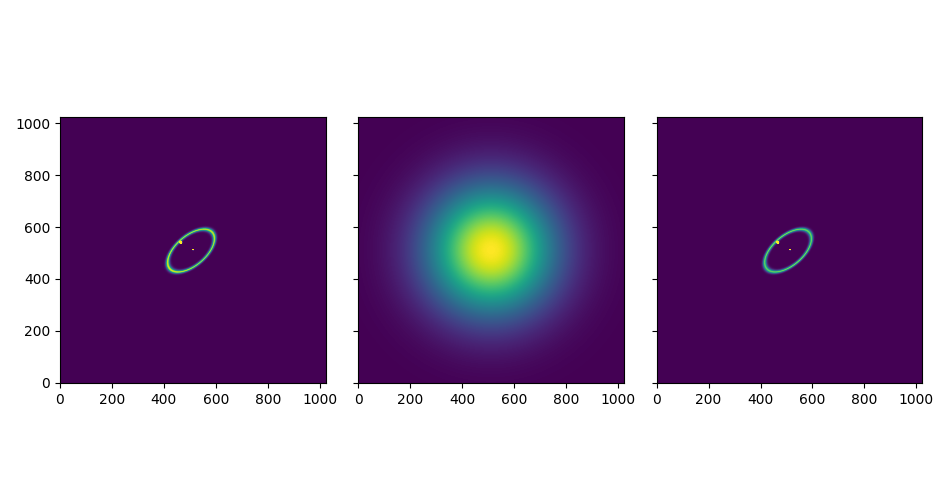

In [12]:
# set size of cutout used to generate images, which is based on the
# initial parameters. The tolerance in compute_rmax might be
# varied if the crop size turns out too large. We set 'zero_node'
# to True because we'll generate unrotated images, and let galario
# do the rest
# ii.compute_rmax(np.append([0, 0], p0[14:]), tol=1e-2, expand=10, zero_node=False)

# this gives an idea of how long an mcmc might take
# %timeit ii.image(p0)

# show an image and the primary beam
im = ii.image(p0[:-1])
fig,ax = plt.subplots(1,3, figsize=(9.5,5), sharey=True, sharex=True)
ax[0].imshow(im, origin='bottom', vmax=np.percentile(im, 99.99))
ax[1].imshow(ii.pb, origin='bottom')
ax[2].imshow(im*ii.pb, origin='bottom', vmax=np.percentile(im, 99.99))
fig.tight_layout()

In [113]:
def lnpostfn(p, return_chi2=False):
    """ Log of posterior probability function """

    for x,r in zip(p,ii.p_ranges):
        if x < r[0] or x > r[1]:
            return -np.inf

    # galario
    chi2 = gd.chi2Image(ii.image(p[:-1]) * ii.pb, dxy, u, v, Re, Im, w, origin='lower')
    if return_chi2:
        return chi2
    
    return -0.5 * ( chi2*p[-1] + np.sum(2*np.log(2*np.pi/(w*p[-1]))) )

nlnpostfn = lambda p: -lnpostfn(p)

In [114]:
# check it works
lnpostfn(p0)

39106356.51617942

### multinest

In [107]:
# multinest
pmn_out = 'multinest_da_flat/'
model_name = pmn_out[:-1]

def mn_prior(cube, ndim, nparam):
    pars = ii.p_ranges
    for i in range(ndim):
        cube[i] = pars[i][0] + cube[i] * (pars[i][1]-pars[i][0])

def mn_lnlike(cube, ndim, nparam):  
    param = np.array([])
    for i in range(ndim):
        param = np.append(param,cube[i])
    return lnpostfn(param)

In [ ]:
# run it (call python script of this notebook with >nice -11 mpiexec -n 40 python3 vis_model_mn.py)
pmn.run(mn_lnlike, mn_prior, ii.n_params, n_live_points=75, verbose=True,
        outputfiles_basename=pmn_out, multimodal=True)

ERROR: Interrupt received: Terminating


In [115]:
# output, start here if multinest was run outside this notebook
a = pmn.Analyzer(outputfiles_basename=pmn_out, n_params=ii.n_params)
# print(a.get_stats())

p = [a.get_stats()['marginals'][i]['median'] for i in range(ii.n_params)]
print(p)
print(lnpostfn(p, return_chi2=True))

for i in range(ii.n_params):
    print('{}\t{}\t{:g}\t{:g}\t{:g}\t{:g}'.format(i, ii.params[i],
                                      a.get_stats()['marginals'][i]['median'], 
                                      p[i]-a.get_stats()['marginals'][i]['1sigma'][0], 
                                      a.get_stats()['marginals'][i]['1sigma'][1]-p[i], 
                                      a.get_stats()['marginals'][i]['3sigma'][1])
         )

  analysing data from multinest_da_flat/.txt
[0.15731342603142484, 0.0901796292849079, 130.66483052217836, 143.7915506292098, 57.36623190076827, 0.0011819099953980993, 6.458038529781365, 0.4295864041511318, 0.12171343775680807, 0.0025663617132875554, 0.06406846232675115, 0.0023078542551325507, 0.0025300395052139176, 2.5489536881546567e-05, -2.8736971440619823, 1.7899085160071768, 0.00021898861734053493, 1.4240225591505877]
8104125.830060975
0	$x_0$	0.157313	0.0567745	0.066828	0.39196
1	$y_0$	0.0901796	0.0579588	0.0632934	0.31246
2	$\Omega$	130.665	0.484412	0.492931	132.002
3	$\omega$	143.792	7.58342	10.2138	171.925
4	$i$	57.3662	0.423104	0.365239	58.6165
5	$F$	0.00118191	4.68713e-05	4.66486e-05	0.00134235
6	$a_0$	6.45804	0.0400979	0.0425372	6.58309
7	$\delta_a$	0.429586	0.322446	0.650094	1.32193
8	$e_f$	0.121713	0.0135642	0.0149812	0.180986
9	$i_f$	0.00256636	0.00177764	0.00157356	0.00499656
10	$e_p$	0.0640685	0.0410418	0.00813045	0.0807409
11	$\sigma_{e,p}$	0.00230785	0.00153397	0.001

In [109]:
a.get_stats()

{'modes': [{'index': 0,
   'strictly local log-evidence': 39108106.26616055,
   'strictly local log-evidence error': 0.022296710747292336,
   'local log-evidence': 39108106.26616055,
   'local log-evidence error': 0.022296710747292336,
   'mean': [0.16169442347998614,
    0.09249812473295305,
    130.661925964785,
    144.68209841863046,
    57.35722309272038,
    0.001180947366894885,
    6.458610695682288,
    0.5589193339997566,
    0.12247742910163706,
    0.0025038494999237147,
    0.05307461159432133,
    0.0023916678293115297,
    0.002560214932720552,
    2.549387073566645e-05,
    -2.8735290917178617,
    1.7903395655553103,
    0.00021899437738360922,
    1.424020417440385],
   'sigma': [0.06595880712884834,
    0.06631208403926273,
    0.4796638346258014,
    8.8148237789754,
    0.398367070616445,
    4.878135265666177e-05,
    0.04166122245907059,
    0.41142204886980316,
    0.014974275184237492,
    0.0014277072356101827,
    0.022687133961658845,
    0.00138083969534855

In [110]:
# alter sigma_a to delta_a if needed for plot
# ii.params[7] = '$\\sigma_a$'
ii.params[7] = '$\\delta_a$'
ii.params

['$x_0$',
 '$y_0$',
 '$\\Omega$',
 '$\\omega$',
 '$i$',
 '$F$',
 '$a_0$',
 '$\\delta_a$',
 '$e_f$',
 '$i_f$',
 '$e_p$',
 '$\\sigma_{e,p}$',
 '$\\sigma_{i,p}$',
 '$F_{star}$',
 '$x_p$',
 '$y_p$',
 '$F_p$',
 '$f_{w}$']

In [111]:
fs = 19
plt.rcParams.update({'font.size': fs})

<IPython.core.display.Javascript object>


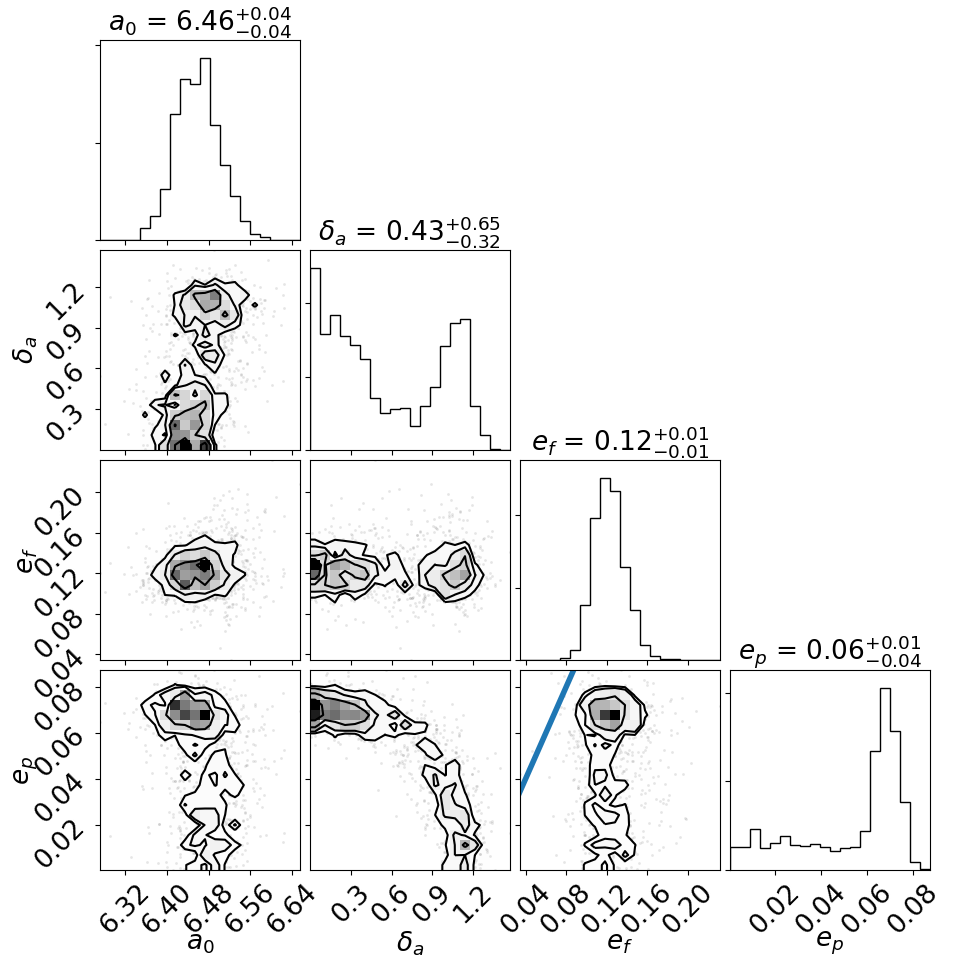

In [112]:
# corner plot
d = a.get_data()
mask = d[:,0] > 1e-8
# fiddle these to plot what we want    x   x x
keep = np.array([0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0],dtype=bool) # part
# keep = np.array([0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,0,0,0,0],dtype=bool) # full
fig = corner.corner(d[mask][:,keep], weights=d[mask,0], labels=np.array(ii.params)[keep[2:]],
                    show_titles=True, title_kwargs={"fontsize": fs},
                    label_kwargs={"fontsize": fs})

ax = fig.get_axes()
xr = np.linspace(0.03,0.1)
ax[np.sum(keep)*3+2].plot(xr,xr, linewidth=4) # part
# ax[np.sum(keep)*4+2].plot(xr,xr, linewidth=4) # full

fig.savefig('{}corner.pdf'.format(pmn_out))

### emcee
(which wasn't used for the paper)

In [15]:
# set up and run mcmc fitting
ndim = ii.n_params        # number of dimensions
nwalkers = 36             # number of walkers
nsteps = 1000              # total number of MCMC steps
nthreads = 8              # CPU threads that emcee should use

sampler = emcee.EnsembleSampler(nwalkers, ndim, lnpostfn, threads=nthreads)

# initialize the walkers with an ndim-dimensional Gaussian ball
pos = [p0 + p0*0.01*np.random.randn(ndim) for i in range(nwalkers)]

# execute the MCMC
pos, prob, state = sampler.run_mcmc(pos, nsteps)

In [16]:
print(sampler.acceptance_fraction)

[0.238 0.276 0.288 0.293 0.301 0.23  0.262 0.243 0.294 0.237 0.27  0.256
 0.269 0.28  0.253 0.269 0.286 0.242 0.268 0.267 0.255 0.261 0.267 0.273
 0.257 0.277 0.289 0.263 0.276 0.256 0.227 0.29  0.294 0.247 0.266 0.282]


In [18]:
# save the chains to file
model_name = 'emcee'
np.savez_compressed(model_name+'/chains-'+model_name+'.npz', sampler.chain, sampler.lnprobability)

In [19]:
# load chains, start here if emcee was run outside this notebook
with np.load(model_name+'/chains-'+model_name+'.npz') as data:
    chain = data['arr_0']
    lnprobability = data['arr_1']

In [20]:
nwalkers, nsteps, ndim = chain.shape
print(chain.shape)

(36, 1000, 18)


<IPython.core.display.Javascript object>


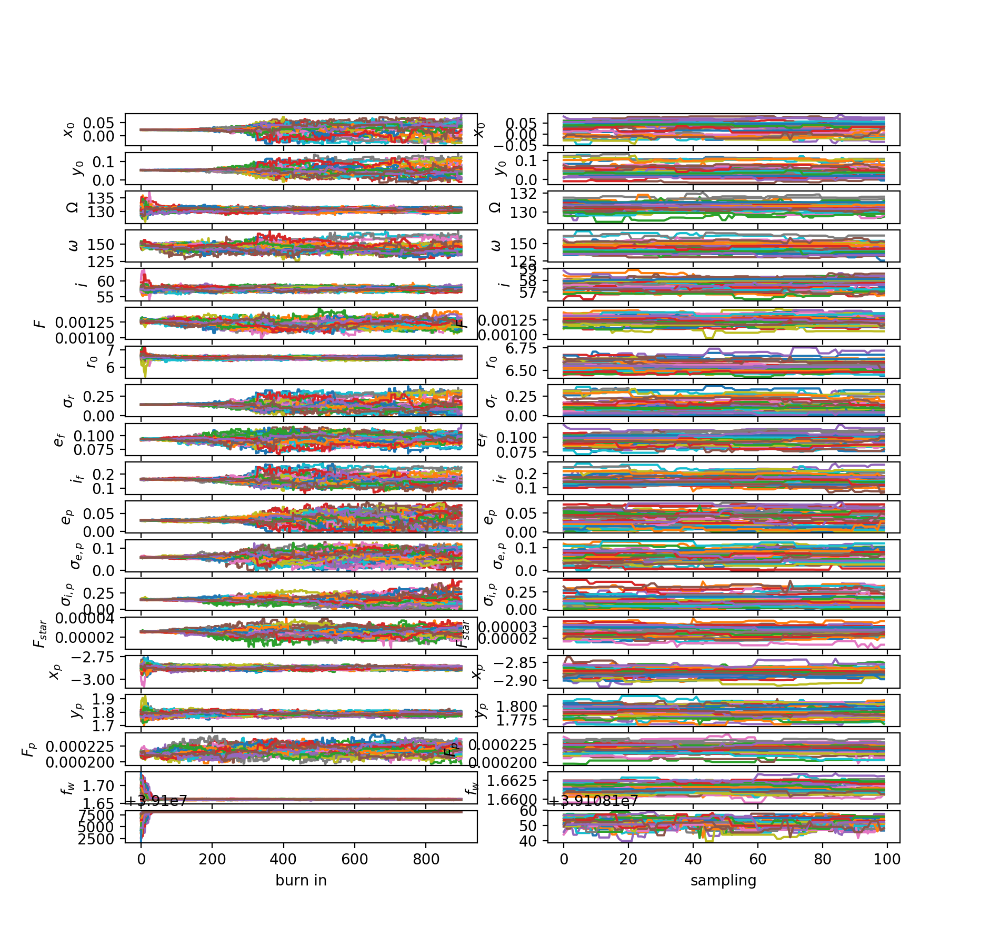

In [21]:
# see what the chains look like, skip a burn in period if desired
burn = 900
fig,ax = plt.subplots(ndim+1,2,figsize=(9.5,9),sharex='col',sharey=False)

for j in range(nwalkers):
    ax[-1,0].plot(lnprobability[j,:burn])
    for i in range(ndim):
        ax[i,0].plot(chain[j,:burn,i])
        ax[i,0].set_ylabel(ii.params[i])

for j in range(nwalkers):
    ax[-1,1].plot(lnprobability[j,burn:])
    for i in range(ndim):
        ax[i,1].plot(chain[j,burn:,i])
        ax[i,1].set_ylabel(ii.params[i])

ax[-1,0].set_xlabel('burn in')
ax[-1,1].set_xlabel('sampling')
fig.savefig(model_name+'/chains-'+model_name+'.pdf')

In [22]:
# make the corner plot
fig = corner.corner(sampler.chain[:,burn:,:].reshape((-1,ndim)), labels=ii.params,
                    show_titles=True)

fig.savefig(model_name+'/corner-'+model_name+'.png')

<IPython.core.display.Javascript object>

In [23]:
# get the median parameters
p = np.median(sampler.chain[:,burn:,:].reshape((-1,ndim)),axis=0)
s = np.std(sampler.chain[:,burn:,:].reshape((-1,ndim)),axis=0)
print(','.join(p.astype(str)))
print(s)

0.03613275171026228,0.04405457007813973,130.51518681918222,143.63641730661783,57.65379009271925,0.0012411660038253983,6.538844107479569,0.11737918538026859,0.09649728522161755,0.14492180650857592,0.0354751234063406,0.06465374075642256,0.10293433645216074,2.5364858959455433e-05,-2.874849298147688,1.7891720103554507,0.0002190517661887102,1.6613087240153797
[2.68415352e-02 3.05776672e-02 4.35745083e-01 7.14045826e+00
 4.45975413e-01 7.21996302e-05 5.58149357e-02 8.79197185e-02
 8.86641162e-03 3.46985586e-02 2.02266388e-02 2.81800323e-02
 9.60975852e-02 4.11974852e-06 1.21469861e-02 1.00505647e-02
 6.42107964e-06 6.51747779e-04]


### post-fitting stuff (regardless of fitting method)

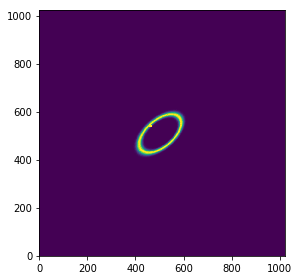

In [19]:
# see what it looks like
im = ii.image(p[:-1])
fig,ax = plt.subplots()
ax.imshow(im, origin='bottom', vmax=np.percentile(im, 99.9))
fig.tight_layout()
fig.savefig(model_name+'/best-'+model_name+'.pdf', dpi=500)

In [20]:
# save the visibilities for subtraction from the data
vis_mod = gd.sampleImage(ii.pb * ii.image(p[:-1]), dxy, u, v, origin='lower')
np.save(model_name+'/vis-'+model_name+'.npy', vis_mod)

In [21]:
# just point source
_ = p.copy()
_[5]=0
vis_mod = gd.sampleImage(ii.pb * ii.image(_[:-1]), dxy, u, v, origin='lower')
np.save(model_name+'/vis-ptsrc.npy', vis_mod)

## Creating a map of the residuals
This must be done within CASA. First the script 'residual' is run to subtract the model visibilities created above from the ms we made at the top.
```python
import alma.casa
alma.casa.residual('../../../../data/alma/hd202628/hd202628.ms',
                   'vis-multinest_da_full.npy', tb, datacolumn='DATA')
tclean(vis='residual.ms', imagename='residual', imsize=[512,512],
       cell='0.05arcsec', interactive=False, niter=0)
exportfits(imagename='residual.image',fitsimage='residual.fits')
alma.casa.residual('../../../../data/alma/hd202628/hd202628.ms',
                   'vis-ptsrc.npy', tb, datacolumn='DATA',ms_new='residual-ptsrc.ms')
tclean(vis='residual-ptsrc.ms', imagename='residual-ptsrc',
       imsize=[512,512], cell='0.05arcsec', interactive=False, niter=0)
exportfits(imagename='residual-ptsrc.image',fitsimage='residual-ptsrc.fits')
```